# 이 코드는 같은 연구실에서 연구중인 안혜성님과 김승현님의 도움을 받았습니다.
* Thanks To Hye-seong An
* Thanks To Seung-hyun Kim 

# 현재 작업 환경 설정 변경

In [1]:
# import os
# os.chdir("/home/sewoong/medimage/")

In [1]:
import sys
# sys.path.append('./model/')
# sys.path.append("./.conda/envs/images/lib/python3.12/site-packages/")
# sys.path.append("./model/EMCAD_model/")
# sys.path.append('./model/pop_medical_seg_models/')
# sys.path.append('./model/sotor_medical_seg_models/ColonFormer/')
# print(sys.path)
sys.path.append("./model/")

# 라이브러리 로드

In [2]:
# files and system
import sys
import time
import random
import glob

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from sklearn.model_selection import train_test_split
from IPython.display import clear_output
# working with images
import cv2
import imageio
import scipy.ndimage
# import skimage.transform

import torchvision.transforms as transforms

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from tqdm import notebook

sys.path.insert(0, '..')

# losses
from medimage.metrics_loss import *

import mmcv

# 함수
- 정확도 측정 함수 (iou, dice, precision, recall, f1)
- 데이터 로드
- 모델 로드
- 손실함수 로드
- 모델 학습 및 이미지 선정

In [3]:
def eval_segmentation(outputs: torch.Tensor, labels: torch.Tensor, metric, batch_output=False):
    # outputs가 dict이거나 tuple일 경우, tensor를 가져옴
    if isinstance(outputs, dict):
        outputs = outputs['out']
    elif isinstance(outputs, tuple):
        outputs = outputs[0]

    # sigmoid를 적용하여 예측값을 확률(0~1)로 변환
    # 만약, 모델에 sigmoid나 이에 상응하는 활성화 함수가 포함되어 있으면 아래 줄을 주석 처리할 것
    outputs = torch.sigmoid(outputs)

    # 픽셀 별 예측 값을 0.5를 기준으로 0 또는 1로 thresholding
    outputs = outputs > 0.5

    # binary class의 경우 출력 channel은 1이므로, (BATCH, 1, H, W)의 형식을 가짐
    # 따라서, (BATCH, 1, H, W) -> (BATCH, H, W)로 차원을 줄여줌
    outputs = outputs.squeeze(1).byte()  # (BATCH, 1, H, W) -> (BATCH, H, W)
    labels = labels.squeeze(1).byte()    # (BATCH, 1, H, W) -> (BATCH, H, W)

    # SMOOTH는 나눗셈에서 분모가 0인 것을 방지하기 위해 더해주는 값
    SMOOTH = 1e-8

    if metric == 'iou':
        # IoU : intersection / union
        intersection = (outputs & labels).float().sum((1, 2))  # (BATCH, H, W)에서 픽셀 단위로 AND 연산 후 합산
        union = (outputs | labels).float().sum((1, 2))         # (BATCH, H, W)에서 픽셀 단위로 OR 연산 후 합산
        result = (intersection + SMOOTH) / (union + SMOOTH)
    elif metric == 'dice':
        # Dice Coefficient: 2 * intersection / (output + label)
        intersection = (outputs & labels).float().sum((1, 2))  # (BATCH, H, W)에서 픽셀 단위로 AND 연산 후 합산
        result = (2 * intersection + SMOOTH) / (outputs.float().sum((1, 2)) + labels.float().sum((1, 2)) + SMOOTH)
    elif metric == 'precision':
        # Precision: TP / (TP + FP)
        true_positive = (outputs & labels).float().sum((1, 2))  # True Positive (TP): 예측과 실제가 모두 1인 경우
        predicted_positive = outputs.float().sum((1, 2))        # Predicted Positive: 예측이 1인 경우
        result = (true_positive + SMOOTH) / (predicted_positive + SMOOTH)
    elif metric == 'recall':
        # Recall: TP / (TP + FN)
        true_positive = (outputs & labels).float().sum((1, 2))  # True Positive (TP): 예측과 실제가 모두 1인 경우
        actual_positive = labels.float().sum((1, 2))            # Actual Positive: 실제가 1인 경우
        result = (true_positive + SMOOTH) / (actual_positive + SMOOTH)
    elif metric == 'f1':
        # F1 Score: 2 * (Precision * Recall) / (Precision + Recall)
        true_positive = (outputs & labels).float().sum((1, 2))  # True Positive (TP): 예측과 실제가 모두 1인 경우
        predicted_positive = outputs.float().sum((1, 2))        # Predicted Positive: 예측이 1인 경우
        actual_positive = labels.float().sum((1, 2))            # Actual Positive: 실제가 1인 경우
        # Precision과 Recall 계산
        precision = (true_positive + SMOOTH) / (predicted_positive + SMOOTH)
        recall = (true_positive + SMOOTH) / (actual_positive + SMOOTH)
        # F1 Score 계산
        result = (2 * precision * recall) / (precision + recall + SMOOTH)  

    if batch_output:
        return result  # shape: [BATCH] : 배치 내 각 이미지별 값 (벡터)
    else:
        return result.mean()  # shape: float (단일 상수 값) : 배치 내 모든 이미지의 평균 (상수)

In [4]:
def load_data(data_name, split_ratio, random_seed):
    df = pd.read_csv('/home/sewoong/medimage/file_path_change.csv')
    # df = pd.DataFrame({col: np.array(df[col]) for col in df.columns})
    
    image_files = list(df[df['type'] == data_name]['images'])
    label_files = list(df[df['type'] == data_name]['labels'])

    if len(split_ratio) == 2:  # split_ratio = (train, test)
        test_size = split_ratio[1] / sum(split_ratio)
        train_images, test_images, train_labels, test_labels = train_test_split(image_files, label_files, test_size=test_size, random_state=random_seed)
        return train_images, test_images, train_labels, test_labels
        
    elif len(split_ratio) == 3:  # split_ratio = (train, validation, test)
        trainval2test_size = split_ratio[2] / sum(split_ratio)
        trainval_images, test_images, trainval_labels, test_labels = train_test_split(image_files, label_files, test_size=trainval2test_size, random_state=random_seed)
        train2val_size = split_ratio[1] / sum(split_ratio[0:2])
        train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=train2val_size, random_state=random_seed)
        return train_images, val_images, test_images, train_labels, val_labels, test_labels

In [5]:
import torch.utils.checkpoint as cp
from model.pop_medical_seg_models.unet_parts import DoubleConv,Down,Up,OutConv

class additional_model_info:
    def colonformer():
        from sotor_medical_seg_models.ColonFormer.colon_lib.models.segmentors.colonformer import ColonFormer
        from sotor_medical_seg_models.ColonFormer.colon_lib.models.decode_heads.uper_head import UPerHead
        
        backbone=dict(type='mit_b3',style='pythorch')
        
        decode_head=dict(type='UPerHead', in_channels=[64], in_index=[0], channels=128, dropout_ratio=0.1,
                            num_classes=1, norm_cfg=dict(type='BN', requires_grad=True), align_corners=False,decoder_params=dict(embed_dim=768),
                            loss_decode=dict(type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0))
        
        
        model = ColonFormer(backbone,decode_head = decode_head,
                        neck=None,
                        auxiliary_head=None,
                        train_cfg=dict(),
                        test_cfg=dict(mode='whole'),
                        pretrained='./model/sotor_medical_seg_models/ColonFormer/colon_lib/pretrained/mit_b3.pth')
        return model
    
    def ducknet():
        from ducknet.duck_net import DuckNet
        def init_weights_with_kaiming_uniform(m):
            '''Initialize the weights of the model with kaiming uniform initialization.'''
            if type(m) == nn.Conv2d:
                torch.nn.init.kaiming_uniform_(m.weight)
        
        def count_parameters(model):
            '''Count the number of trainable parameters in the model.'''
            return sum(p.numel() for p in model.parameters() if p.requires_grad)
            
        # official DuckNet model 
        model = DuckNet(in_channels=3, out_channels=1, depth=5, init_features=34, normalization=None, interpolation='nearest', out_activation=None, use_multiplier=True)
        model.apply(init_weights_with_kaiming_uniform) # default init is xaiver uniform

        return model

In [6]:
def init_model(model_name):
    model = None  # 기본값을 None으로 설정하여 변수가 초기화되지 않는 상황 방지
    
    if model_name == 'FCBformer':
        from FCBformer.FCBmodels import FCBFormer
        model = FCBFormer(size=224)
        
    elif model_name == 'EMCADNet':
        from EMCAD import EMCADNet
        model = EMCADNet(encoder='./EMCAD_model/pvt_v2_b2')

    elif model_name == 'ColonSegNet':
        from pop_medical_seg_models.ColonSegNet import CompNet as ColonSegNet
        model = ColonSegNet()
        model = model.to(DEVICE)

    elif model_name == 'FCN':
        from pop_seg_models.FCN.models.segmentation.fcn import fcn_resnet101
        model = fcn_resnet101(num_classes=1)

    elif model_name == 'DeepLab_V3+':
        sys.path.append("./pop_seg_models/DeepLab_V3_p/")
        from pop_seg_models.DeepLab_V3_p.model import DeepLab as DeepLab_V3_p
        model = DeepLab_V3_p(backbone='resnet', num_classes=1)

    elif model_name == 'ESFPNet':
        from sotor_medical_seg_models.ESFPNet.ESFPmodel import ESFPNetStructure
        model = ESFPNetStructure(embedding_dim=224)

    elif model_name == 'Unet':
        from pop_medical_seg_models.unet import UNet
        model = UNet(n_channels=3, n_classes=1, pretrained=True)

    elif model_name == 'UNet++':
        from pop_medical_seg_models.nnunet import Nested_UNet as UNet_2p
        model = UNet_2p(1, 3)

    elif model_name == 'DuckNet':
        model = additional_model_info.ducknet()

    elif model_name == 'ColonFormer':
        model = additional_model_info.colonformer()
        params = model.parameters()

    elif model_name == 'caranet':
        from caranet.caranet import caranet
        model = caranet()

    elif model_name == 'FAT_Net':
        from FATNet_model.FAT_Net import FAT_Net
        model = FAT_Net()
        model = model.to(DEVICE)

    # 모델이 None인 경우, 예외 처리
    if model is None:
        raise ValueError(f"모델 이름 '{model_name}'이 잘못되었거나 모델을 로드할 수 없습니다.")
    
    # Load the model to DEVICE (GPU/CPU)
    model = model.to(DEVICE)
    
    return model


In [7]:
def load_loss(loss_name):
    dic_name2func={
        'IoULoss' : IoULoss,
        'DiceLoss' : DiceLoss,
        'BCELoss' : BCELoss,
        'FocalLoss' : FocalLoss,
        'IoUDiceLoss' : IoUDiceLoss,
        'IoUBCELoss' : IoUBCELoss,
        'IoUFocalLoss' : IoUFocalLoss,
        'DiceBCELoss' : DiceBCELoss,
        'DiceFocalLoss' : DiceFocalLoss,
        'BCEFocalLoss' : BCEFocalLoss,
    }
    return dic_name2func[loss_name]()

In [8]:
def training_model(data_names, model_name, loss_names, split_ratio=[0.6, 0.2, 0.2], base_random_seed=42, epochs=200, patience=50, BATCH_SIZE=8):
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for n_data, data_name in enumerate(data_names):
        if base_random_seed != None:
            random_seed = base_random_seed
            random.seed(random_seed)
            np.random.seed(random_seed)
            torch.manual_seed(random_seed)
            torch.cuda.manual_seed(random_seed)
            torch.backends.cudnn.deterministic = True

        train_images, val_images, test_images, train_labels, val_labels, test_labels = load_data(data_name, split_ratio=split_ratio, random_seed=random_seed)

        custom_dataset_train = myDataSet(train_images, train_labels, transforms=test_transforms)
        custom_dataset_val = myDataSet(val_images, val_labels, transforms=test_transforms)
        custom_dataset_test = myDataSet(test_images, test_labels, transforms=test_transforms)
       
        dataloader_train = torch.utils.data.DataLoader(custom_dataset_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
        dataloader_val = torch.utils.data.DataLoader(custom_dataset_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        dataloader_test = torch.utils.data.DataLoader(custom_dataset_test, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        
        model = init_model(model_name)
        model = model.to(DEVICE)

        for n_loss, loss_name in enumerate(loss_names):
            print(f"Start the task training_model : {n_data+1}'s data is {data_name} and {n_loss+1}'s loss function is {loss_name}")
            criterion = load_loss(loss_name)
            optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4, weight_decay = 1e-8)                    

            state = {'best_val_dice' : 0, 'best_val_loss' : np.inf, 'best_epoch' : 0, 'last_epoch' : -1}    
        
            for epoch in range(epochs):
                model.train()
                for imgs, masks in dataloader_train:
                    if len(imgs) == 1: continue 
                        
                    imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
                    prediction = model(imgs)

                    if isinstance(prediction, dict):
                        prediction = torch.Tensor(prediction['out'])
                    elif isinstance(prediction, tuple):
                        prediction = torch.Tensor(prediction[0])
                    else:
                        prediction = prediction     
                
                    optimizer.zero_grad()
                    loss = criterion(prediction, masks)
                    loss.backward()
                    optimizer.step()

                model.eval()
                val_loss, val_num, val_iou, val_dice, val_f1 = 0, 0, 0, 0, 0
                with torch.no_grad():
                    for imgs, masks in dataloader_val:
                        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
                        prediction = model(imgs)

                        if isinstance(prediction, dict):
                            prediction = torch.Tensor(prediction['out'])
                        elif isinstance(prediction, tuple):
                            prediction = torch.Tensor(prediction[0])
                        else:
                            prediction = prediction    
                
                        loss = criterion(prediction, masks)
                        val_loss += loss.item()
                        val_num += len(imgs)
                        val_iou += eval_segmentation(prediction, masks, metric='iou', batch_output=True).sum()
                        val_dice += eval_segmentation(prediction, masks, metric='dice', batch_output=True).sum()
                        val_f1 += eval_segmentation(prediction, masks, metric='f1', batch_output=True).sum()

                # compute epoch-overall metric for val        
                epoch_val_loss = val_loss/len(dataloader_val)
                epoch_val_iou = (val_iou/val_num).item()
                epoch_val_dice = (val_dice/val_num).item()
                epoch_val_f1 = (val_f1/val_num).item()
            
                if epoch_val_dice >= state['best_val_dice']:
                    state['best_val_dice'] = epoch_val_dice
                    print(f'\tSaving.. {epoch+1} of {epochs}, best_val_dice improved from {state['best_val_dice']:.4f} to {epoch_val_dice:.4f}')
                    torch.save(model.state_dict(), f"/home/sewoong/model_recorder/{data_name}_{loss_name}.pth")
            
                elif epoch - state['best_epoch'] > patience:
                    print(f"\n\tEarly stopping. Target criteria has not improved for {patience} epochs.\n")
                    break

def we_want_to_do(data_names, model_name, loss_names, split_ratio=[0.6,0.2,0.2], base_random_seed=42, epochs=200, patience=50, BATCH_SIZE=8, pass_num=0):

    result = {}
    
    model = init_model(model_name)
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    for data_name in data_names:
        score_history = {}
        loss_history = {}

        if base_random_seed != None:
            random_seed = base_random_seed
            random.seed(random_seed)
            np.random.seed(random_seed)
            torch.manual_seed(random_seed)
            torch.cuda.manual_seed(random_seed)
            torch.backends.cudnn.deterministic = True

        _, _, test_images, _, _, test_labels = load_data(data_name, split_ratio=split_ratio, random_seed=random_seed)
        custom_dataset_test = myDataSet(test_images, test_labels, transforms=test_transforms)
        dataloader_test = torch.utils.data.DataLoader(custom_dataset_test, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
        
        test_img_cnt = len(dataloader_test)

        for loss_name in loss_names:
            model.load_state_dict(torch.load(f"/home/sewoong/model_recorder/{data_name}_{loss_name}.pth", weights_only=True))
            model.to(DEVICE)

            criterion = load_loss(loss_name)
            optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4, weight_decay = 1e-8) 
        
            model.eval()
            with torch.no_grad():
                for i, (imgs, masks) in enumerate(dataloader_test):
                    # 라벨이 없는 데이터가 존재. 이를 후보에서 제외.
                    if masks.min() == masks.max():
                        test_img_cnt -= 1 # 전체에서 하나 빠졌기에 하나 뺀다.
                        continue
                    
                    imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
                    prediction = model(imgs)
        
                    if isinstance(prediction, dict):
                        prediction = torch.Tensor(prediction['out'])
                    elif isinstance(prediction, tuple):
                        prediction = torch.Tensor(prediction[0])
                    else:
                        prediction = prediction    
                
                    loss = criterion(prediction, masks)
                    test_loss = loss.item()
                    test_iou = eval_segmentation(prediction, masks, metric='iou', batch_output=True).sum().item()
                    test_dice = eval_segmentation(prediction, masks, metric='dice', batch_output=True).sum().item()
                    test_f1 = eval_segmentation(prediction, masks, metric='f1', batch_output=True).sum().item()

                    test_precision = eval_segmentation(prediction, masks, metric='precision', batch_output=True).sum().item()
                    test_recall = eval_segmentation(prediction, masks, metric='recall', batch_output=True).sum().item()
        
                    img_score = test_dice
                    
                    if not i in loss_history:
                        loss_history[i] = [imgs.cpu(), masks.cpu()]
                    loss_history[i].append((loss_name, prediction))
                    
                    if not i in score_history:
                        score_history[i] = 0
                    score_history[i] += img_score

                    del imgs, masks, prediction, test_iou, test_dice, test_f1, img_score
                    torch.cuda.empty_cache()
            
        # print(f'{data_name} : number of the test image is {test_img_cnt}')

        score_lst = np.array(list(score_history.values()))

        for _ in range(pass_num): # 몇번째로 좋은 성능을 내는 이미지를 택할 것인가?
            pick_the_img = score_lst.argmax()
            score_lst[pick_the_img] = -np.inf

        pick_the_img = score_lst.argmax()
        result[data_name] = (loss_history[pick_the_img])
        
        # for _ in range(pass_num): # 몇번째로 안 좋은 성능을 내는 이미지를 택할 것인가?
        #     pick_the_img = score_lst.argmin()
        #     score_lst[pick_the_img] = np.inf
            
        # pick_the_img = score_lst.argmin()
        # result[data_name] = (loss_history[pick_the_img])

    return result

# 데이터셋 클래스 생성
> 해당 클래스는 이용하려는 이미지와 라벨의 모든 경로(/data/segmentation/...)의 리스트를 인자로 받는다.   

In [9]:
_size = 224, 224
resize = transforms.Resize(_size, interpolation=0)

# set your transforms 
train_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                           transforms.RandomRotation(180),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(_size, padding = 10), # needed after rotation (with original size)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                       ])

# Save images to folder and create a custom dataloader that loads them from their path. More involved than method 1 but allows for greater flexibility
# Requires 3 functions: __init__ to initialize the object, and __len__ and __get__item for pytorch purposes. More functions can be added as needed, but those 3 are necessary for it to function with pytorch
class myDataSet(object):

    def __init__(self, path_images, path_masks, transforms):
        "Initialization"
        self.all_path_images = sorted(path_images)
        self.all_path_masks = sorted(path_masks)
        self.transforms = transforms

    def __len__(self):
        "Returns length of dataset"
        return len(self.all_path_images)  

    def __getitem__(self, index):
        "Return next item of dataset"
        
        if torch.is_tensor(index):        # 인덱스가 tensor 형태일 수 있으니 리스트 형태로 바꿔준다.
            index = index.tolist()
        
        # Define path to current image and corresponding mask
        path_img = self.all_path_images[index]
        path_mask = self.all_path_masks[index]

        # Load image and mask:
        #     .jpeg has 3 channels, channels recorded last
        #     .jpeg records values as intensities from 0 to 255
        #     masks for some reason have values different to 0 or 255: 0, 1, 2, 3, 4, 5, 6, 7, 248, 249, 250, 251, 252, 253, 254, 255
        img_bgr = cv2.imread(path_img) 
        img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)  # cv2는 채널이 BGR로 저장된다 -> 출력할 때 RGB로 바꿔줘야함
        img = img / 255  # 픽셀 값들을 0~1로 변환한다
        
        mask = cv2.imread(path_mask)[:, :, 0] / 255  # 마스크의 채널은 1개만 있으면 된다
        mask = mask.round() # binarize to 0 or 1 (이진분류)
        
        # note, resizing happens inside transforms
        
        # convert to Tensors and fix the dimentions
        img = torch.FloatTensor(np.transpose(img, [2, 0 ,1])) # Pytorch uses the channels in the first dimension
        mask = torch.FloatTensor(mask).unsqueeze(0) # Adding channel dimension to label
        
        # apply transforms/augmentation to both image and mask together
        sample = torch.cat((img, mask), 0) # insures that the same transform is applied
        sample = self.transforms(sample)
        img = sample[:img.shape[0], ...]
        mask = sample[img.shape[0]:, ...]

        return img, mask

# 모델 사용 여부 확인 
> 사용 모델은 FCBFormer 뿐

In [10]:
# models = ['ColonFormer','DuckNet','UNet++','Unet','SegResNet','ESFPNet','DeepLab_V3+','FCN','ColonSegNet',
#          'EMCADNet','FCBFormer','caranet', 'FAT_Net']
# for model in models:
#     try: 
#         init_model(model)
#         print(f'{model} load가능\n')
#     except Exception as e:
#         print(f'{model} 로드 중 에러발생, 모델 로드 불가: {e}\n')

model = 'FCBformer'
try: 
    init_model(model)
    print(f'{model} load가능\n')
except Exception as e:
    print(f'{model} 로드 중 에러발생, 모델 로드 불가: {e}\n')

/home/sewoong/.conda/envs/JSW/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/sewoong/.conda/envs/JSW/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/home/sewoong/medimage/model/FCBformer/pvt_v2.py:331: UserWarning: Overwriting pvt_v2_b0 in registry with FCBformer.pvt_v2.pvt_v2_b0. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
/home/sewoong/medimage/model/FCBformer/pvt_v2.py:342: UserWarning: Overwriting pvt_v2_b1 in registry with FCBformer.pvt_v2.pvt_v2_b1. This is because the

FCBformer load가능



# 모델 학습과 이미지 선정

In [11]:
all_data = [
    'ISIC'
] # 'wound', 'CVC-ClinicDB', 'Kvasir-SEG', 'breast-cancer-benign', 'breast-cancer-malignant', 

all_models = 'FCBformer'

all_losses = [
    'IoUFocalLoss', 'DiceBCELoss', 'IoUDiceLoss', 'IoUBCELoss', 'IoULoss', 
    'BCELoss', 'DiceLoss', 'BCEFocalLoss', 'DiceFocalLoss', 'FocalLoss'
]

# 학습 후 path 추가
* 학습 후 주석처리하길 추천드립니다.

In [ ]:
parameter = {
    'data_names' : all_data, # begin부터 다시
    'model_name' : all_models,
    'loss_names' : all_losses,
    'split_ratio' : [0.6, 0.2, 0.2], 
    'base_random_seed' : 42,
    'epochs' : 200,
    'patience' : 40,
    'BATCH_SIZE' : 8
}

training_model(**parameter)

Start the task training_model : 1's data is ISIC and 1's loss function is IoUFocalLoss
	Saving.. 1 of 200, best_val_dice improved from 0.8732 to 0.8732
	Saving.. 2 of 200, best_val_dice improved from 0.8836 to 0.8836
	Saving.. 5 of 200, best_val_dice improved from 0.8899 to 0.8899
	Saving.. 7 of 200, best_val_dice improved from 0.8937 to 0.8937
	Saving.. 9 of 200, best_val_dice improved from 0.8974 to 0.8974
	Saving.. 11 of 200, best_val_dice improved from 0.9022 to 0.9022


# 그림

In [ ]:
parameter = {
    'data_names' : all_data, # begin부터 다시
    'model_name' : all_models,
    'loss_names' : all_losses,
    'split_ratio' : [0.6, 0.2, 0.2], 
    'base_random_seed' : 42,
    'epochs' : 200,
    'patience' : 40,
    'BATCH_SIZE' : 1,
    'pass_num' : 5
}

result = we_want_to_do(**parameter)

""" 하나의 데이터에 대한 정보 저장은 아래와 같다.
{data_name: 
 [   img, mask,
     (loss_name, prediction), (loss_name, prediction), (loss_name, prediction), (loss_name, prediction), (loss_name, prediction), 
     (loss_name, prediction), (loss_name, prediction), (loss_name, prediction), (loss_name, prediction), (loss_name, prediction)
 ]
}
"""

# **그리기 함수**
- 예측 이미지에 시그모이드 적용
- 시그모이드 적용에 이진 분류 적용

In [ ]:
def draw(data_name, result, n_row, row_lim, col_lim, title=False):
    row_min, row_max = row_lim
    col_min, col_max = col_lim

    datas = result[data_name]
    
    for i, data in enumerate(datas):
        if i == 0:
            img = data[0].permute(1,2,0)
            img = img[row_min:row_max, col_min:col_max]
            _ = axs[n_row][i].imshow(img)
            _ = axs[n_row][i].set_xticks([])
            _ = axs[n_row][i].set_yticks([])

            ylabel_name = data_name.replace('breast-cancer', 'BRCA') if 'breast-cancer' in data_name else data_name
            _ = axs[n_row][i].set_ylabel(ylabel_name, fontsize=15)
            
            if title: 
                _ = axs[n_row][i].set_title('Image', fontsize=25)
            continue
            
        if i == 1:
            label = data[0].permute(1,2,0)
            label = label[row_min:row_max, col_min:col_max]
            _ = axs[n_row][i].imshow(label, cmap='gray')
            _ = axs[n_row][i].axis('off')
            if title: nvi
                _ = axs[n_row][i].set_title('Target', fontsize=25)
            continue
        
        loss_name, image = data
        image = image[0].to('cpu').permute(1,2,0).numpy()
        image = image[row_min:row_max, col_min:col_max]

        cut_line = image.mean()
        image = (image > cut_line).astype(float)
        
        _ = axs[n_row][i].imshow(image, cmap='gray')
        _ = axs[n_row][i].axis('off')
        if title : 
            loss_name = loss_name.replace('Loss', '')
            _ = axs[n_row][i].set_title(loss_name, fontsize=25)

In [ ]:
def draw_with_sigmoid(data_name, n_row, row_lim, col_lim, title=False):
    row_min, row_max = row_lim
    col_min, col_max = col_lim
    datas = result[data_name]

    for i, data in enumerate(datas):
        if i == 0:  # 원본 이미지
            img = data[0].permute(1, 2, 0)
            img = img[row_min:row_max, col_min:col_max]
            axs[n_row][i].imshow(img)
            axs[n_row][i].set_xticks([])
            axs[n_row][i].set_yticks([])

            label = data_name.replace('breast-cancer-', 'BRCA-') if 'breast-cancer' in data_name else data_name
            axs[n_row][i].set_ylabel(label, fontsize=15)

            if title:
                axs[n_row][i].set_title('Image', fontsize=25)
            continue
        
        if i == 1:  # 타겟
            label = data[0].permute(1, 2, 0)
            label = label[row_min:row_max, col_min:col_max]
            axs[n_row][i].imshow(label, cmap='gray')
            axs[n_row][i].axis('off')

            if title:
                axs[n_row][i].set_title('Target', fontsize=25)
            continue

        # 결과 (Sigmoid 변환 적용)
        loss_name, image = data
        image = torch.sigmoid(image[0].to('cpu')).permute(1, 2, 0).detach().numpy()
        image = image[row_min:row_max, col_min:col_max]

        axs[n_row][i].imshow(image, cmap='gray')
        axs[n_row][i].axis('off')
        if title:
            loss_name = loss_name.replace('Loss', '')
            axs[n_row][i].set_title(loss_name, fontsize=25)

def draw_with_binary(data_name, n_row, row_lim, col_lim, title=False, threshold=0.5):
    row_min, row_max = row_lim
    col_min, col_max = col_lim
    datas = result[data_name]

    for i, data in enumerate(datas):
        if i == 0:  # 원본 이미지
            img = data[0].permute(1, 2, 0)
            img = img[row_min:row_max, col_min:col_max]
            axs[n_row][i].imshow(img)
            # axs[n_row][i].set_xticks([])
            # axs[n_row][i].set_yticks([])

            label = data_name.replace('breast-cancer-', 'BRCA-') if 'breast-cancer' in data_name else data_name
            axs[n_row][i].set_ylabel(label, fontsize=15)

            if title:
                axs[n_row][i].set_title('Image', fontsize=25)
            continue

        if i == 1:  # 타겟
            label = data[0].permute(1, 2, 0)
            label = label[row_min:row_max, col_min:col_max]
            axs[n_row][i].imshow(label, cmap='gray')
            axs[n_row][i].axis('off')

            if title:
                axs[n_row][i].set_title('Target', fontsize=25)
            continue

        # 결과 (Sigmoid 변환 후 이진화)
        loss_name, image = data
        image = torch.sigmoid(image[0].to('cpu')).permute(1, 2, 0).detach().numpy()
        image = image[row_min:row_max, col_min:col_max]
        image = (image > threshold).astype(float)  # 이진화

        axs[n_row][i].imshow(image, cmap='gray')
        axs[n_row][i].axis('off')
        if title:
            loss_name = loss_name.replace('Loss', '')
            axs[n_row][i].set_title(loss_name, fontsize=25)

# **결과**
> 10/20/35 pass

In [17]:
all_data = ['wound', 'CVC-ClinicDB', 'Kvasir-SEG', 
            'breast-cancer-benign', 'breast-cancer-malignant', 'ISIC-2017']
all_models = 'FCBFormer'
all_losses = ['IoUFocalLoss', 'DiceBCELoss', 'IoUDiceLoss', 'IoUBCELoss', 'IoULoss', 
              'BCELoss', 'DiceLoss', 'BCEFocalLoss', 'DiceFocalLoss', 'FocalLoss']

parameter = {
    'data_names' : all_data, 'model_name' : all_models, 'loss_names' : all_losses,
    'split_ratio' : [0.6, 0.2, 0.2], 'base_random_seed' : 42, 'epochs' : 200, 'patience' : 40, 'BATCH_SIZE' : 1,
    'pass_num' : None
}

#### **0**

In [18]:
pass_num = 0
# parameter['pass_num'] = pass_num

result_0 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_0, n_row=0, row_lim=(25,105), col_lim=(0,80), title=True)
draw('CVC-ClinicDB', result_0, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_0, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_0, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_0, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_0, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

TypeError: 'NoneType' object cannot be interpreted as an integer

#### **1**

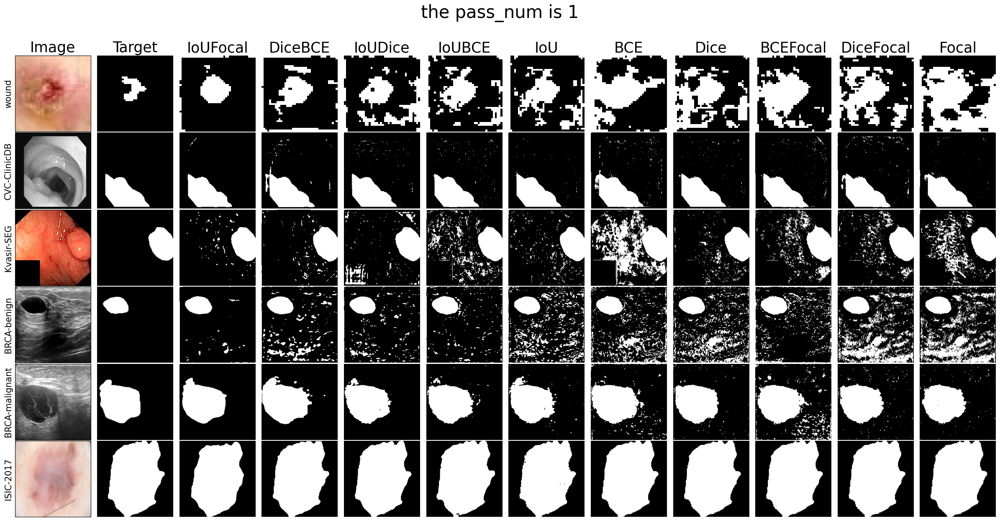

In [79]:
pass_num = 1
# parameter['pass_num'] = pass_num

# result_1 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_1, n_row=0, row_lim=(0,40), col_lim=(0,40), title=True)
draw('CVC-ClinicDB', result_1, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_1, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_1, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_1, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_1, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **2**

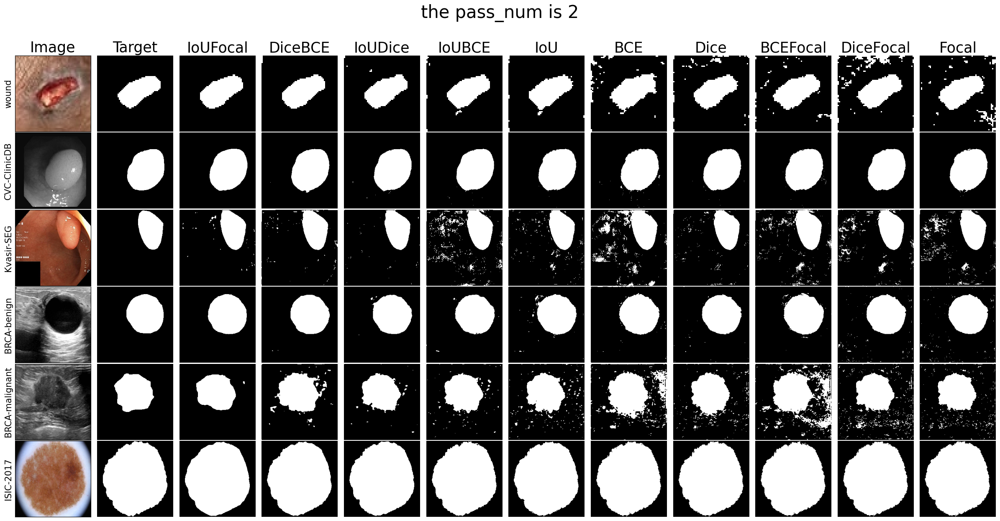

In [80]:
pass_num = 2
# parameter['pass_num'] = pass_num

# result_2 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_2, n_row=0, row_lim=(10,70), col_lim=(0,60), title=True)
draw('CVC-ClinicDB', result_2, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_2, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_2, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_2, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_2, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **3**

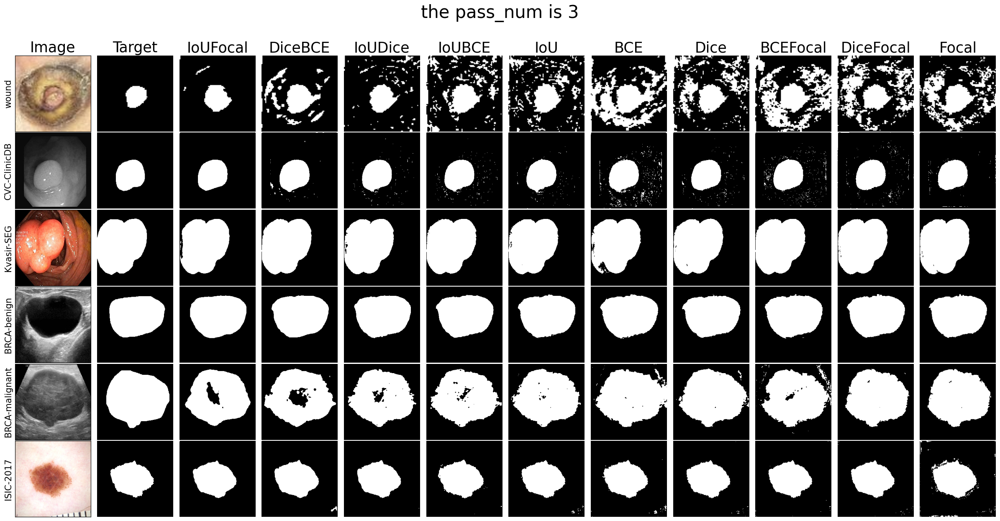

In [81]:
pass_num = 3
# parameter['pass_num'] = pass_num

# result_3 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_3, n_row=0, row_lim=(30,110), col_lim=(0,80), title=True)
draw('CVC-ClinicDB', result_3, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_3, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_3, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_3, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_3, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **4**

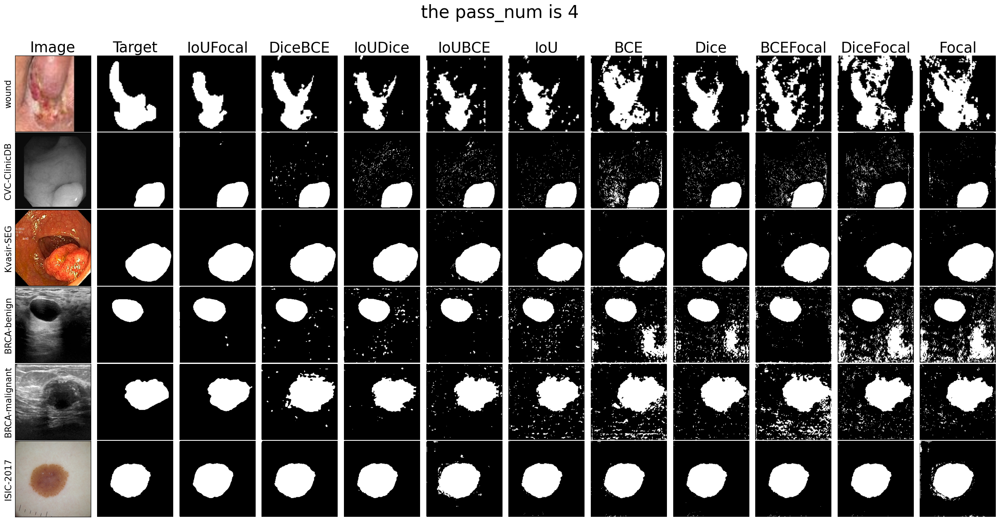

In [83]:
pass_num = 4
# parameter['pass_num'] = pass_num

# result_4 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_4, n_row=0, row_lim=(35,115), col_lim=(0,80), title=True)
draw('CVC-ClinicDB', result_4, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_4, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_4, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_4, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_4, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **5**

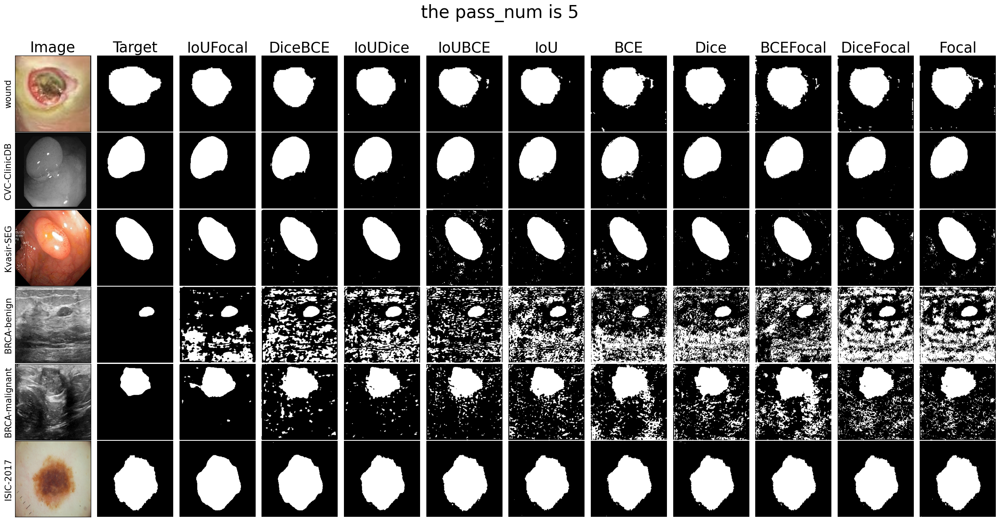

In [84]:
pass_num = 5
# parameter['pass_num'] = pass_num

# result_5 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_5, n_row=0, row_lim=(30,120), col_lim=(0,90), title=True)
draw('CVC-ClinicDB', result_5, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_5, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_5, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_5, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_5, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **6**

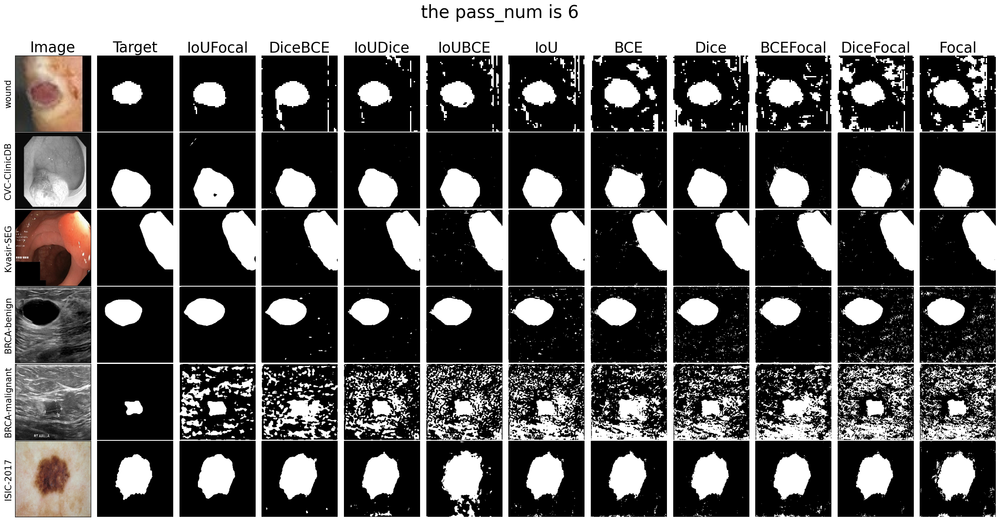

In [85]:
pass_num = 6
# parameter['pass_num'] = pass_num

# result_6 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_6, n_row=0, row_lim=(10,70), col_lim=(0,60), title=True)
draw('CVC-ClinicDB', result_6, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_6, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_6, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_6, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_6, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **7**

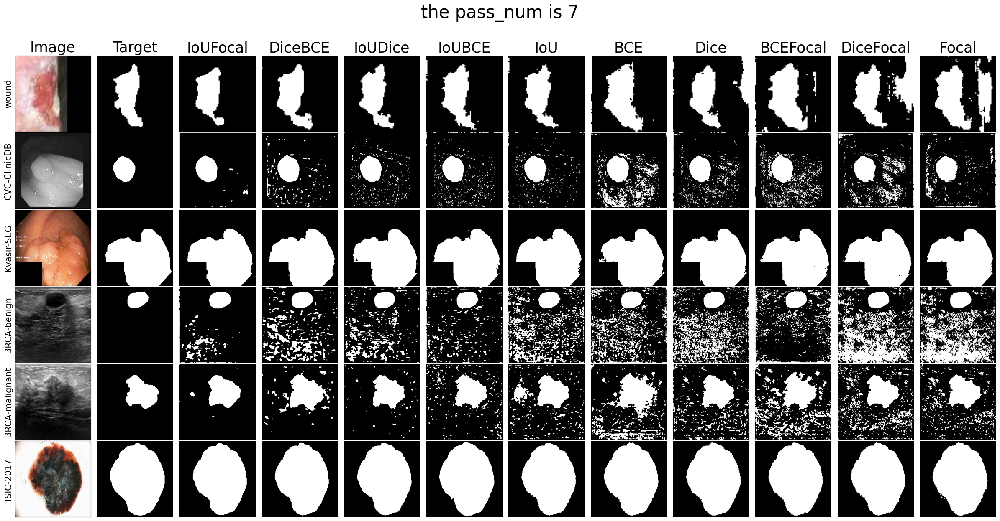

In [86]:
pass_num = 7
# parameter['pass_num'] = pass_num

# result_7 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_7, n_row=0, row_lim=(20,90), col_lim=(0,70), title=True)
draw('CVC-ClinicDB', result_7, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_7, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_7, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_7, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_7, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **8**

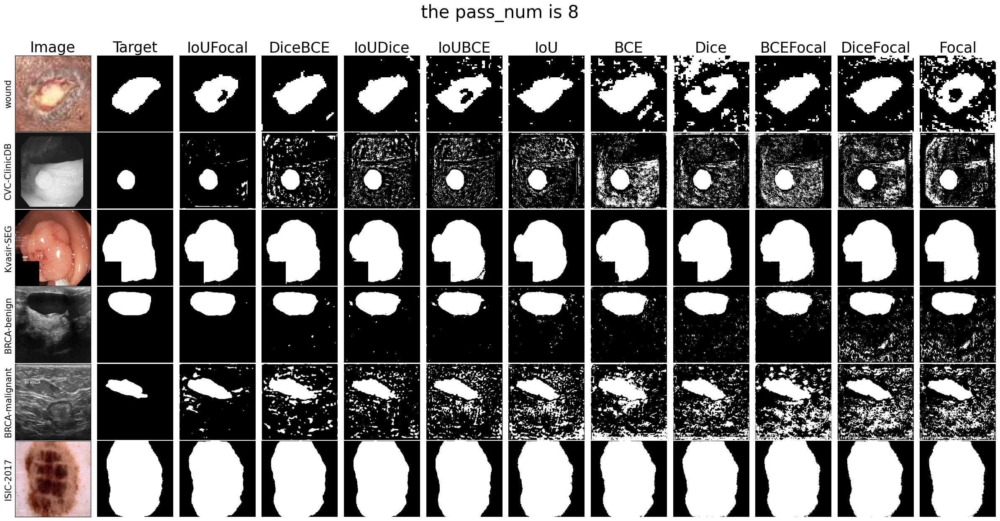

In [87]:
pass_num = 8
# parameter['pass_num'] = pass_num

# result_8 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_8, n_row=0, row_lim=(30,90), col_lim=(0,60), title=True)
draw('CVC-ClinicDB', result_8, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_8, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_8, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_8, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_8, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)

#### **9**

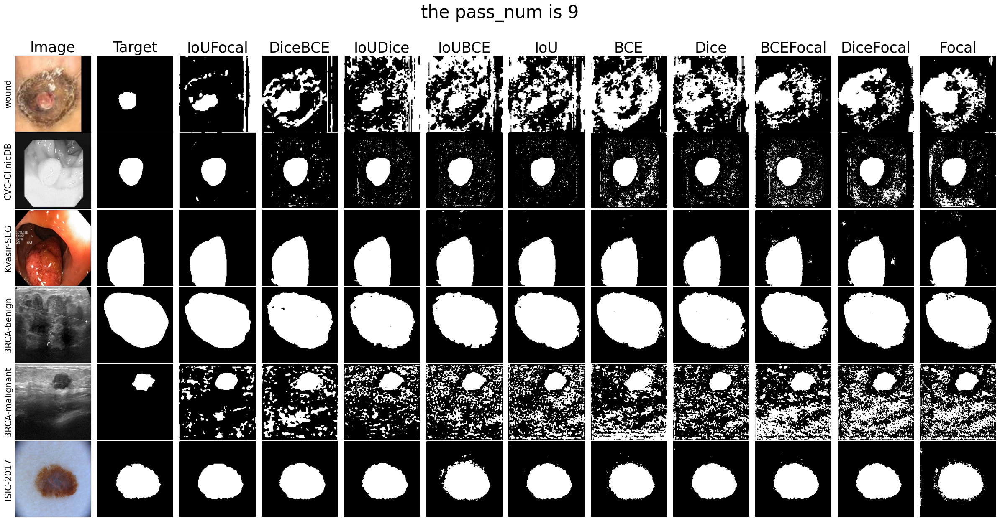

In [88]:
pass_num = 9
# parameter['pass_num'] = pass_num

# result_9 = we_want_to_do(**parameter)
    
fig = plt.figure(figsize=(24, 16), dpi=100)
axs = fig.subplots(6, 12)

_ = plt.suptitle(f'the pass_num is {pass_num}', fontsize=30, y=0.9)
    
draw('wound', result_9, n_row=0, row_lim=(20,120), col_lim=(0,100), title=True)
draw('CVC-ClinicDB', result_9, n_row=1, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('Kvasir-SEG', result_9, n_row=2, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-benign', result_9, n_row=3, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('breast-cancer-malignant', result_9, n_row=4, row_lim=(0,-1), col_lim=(0,-1), title=False)
draw('ISIC-2017', result_9, n_row=5, row_lim=(0,-1), col_lim=(0,-1), title=False)

plt.tight_layout(h_pad=-25)